In [2]:
#import all the libraries
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance
import kornia
import cv2
import torch
from skimage.transform import ProjectiveTransform, warp
from skimage import transform
import scipy
from scipy.spatial.distance import cdist
import random
from tqdm.notebook import tqdm
plt.rcParams['figure.figsize'] = [15, 15]

In [3]:
###step 1: load images and convert to gray scale

#Loading the images
image1 = cv2.imread('parliament-left.jpg')
image2 = cv2.imread('parliament-right.jpg')

#Converting to grayscale
gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Resize one of the images to match the height of the other one
height1, width1 = gray_image1.shape[:2]
height2, width2 = gray_image2.shape[:2]

if height1 < height2:
    gray_image1 = cv2.resize(gray_image1, (width1, height2))
elif height2 < height1:
    gray_image2 = cv2.resize(gray_image2, (width2, height1))
    
print(gray_image1.shape)
print(gray_image2.shape)

(2575, 2556)
(2575, 2266)


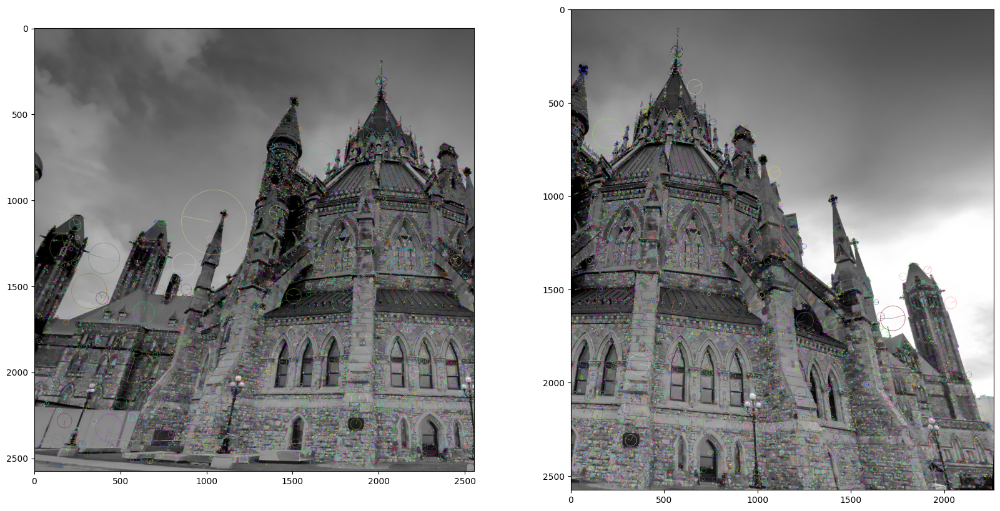

In [4]:
###step 2: Detect keypoints and extract descriptors

#creating a SIFT object
sift = cv2.SIFT_create()

#Detect keypoints and descriptors
keypoints1, descriptors1 = sift.detectAndCompute(gray_image1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray_image2, None)

#draw the detected keypoints in the images
image1_with_keypoints = cv2.drawKeypoints(gray_image1, keypoints1, outImage=gray_image1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image2_with_keypoints = cv2.drawKeypoints(gray_image2, keypoints2, outImage=gray_image2,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#total_kp = np.concatenate((image1_with_keypoints, image2_with_keypoints), axis=1)
# show the images
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(image1_with_keypoints,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(image2_with_keypoints,cmap='gray') 
plt.show()

In [5]:
###step 3: Match features

# Compute squared Euclidean distances between descriptors
distances = scipy.spatial.distance.cdist(descriptors1,descriptors2,'sqeuclidean')

# Create tensor objects from descriptors
descriptor_tensor1 = torch.from_numpy(descriptors1)
descriptor_tensor2 = torch.from_numpy(descriptors2)

# Use kornia to find matches
matches = kornia.feature.match_snn(descriptor_tensor1, descriptor_tensor2)


In [6]:
###provided starter code 

# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """

    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')
    
# Usage:
# fig, ax = plt.subplots(figsize=(20,10))
# plot_inlier_matches(ax, img1, img2, computed_inliers)

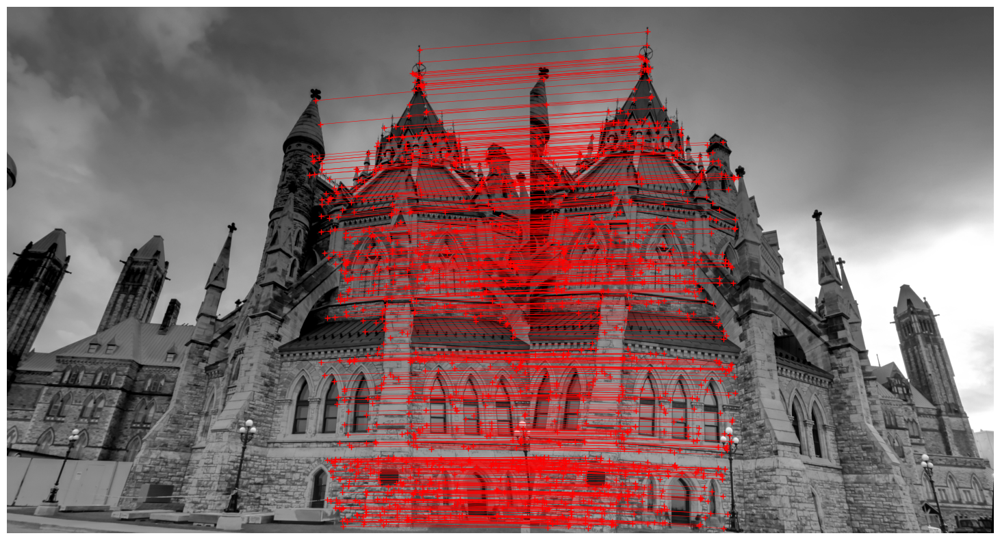

In [7]:
###step 4: Prune features

# Specify a distance threshold for inlier selection
distance_threshold = 0.15

# Extract distances and indices from the matches tuple
distances, indices = matches

valid_matches = distances < distance_threshold
# Get the indices of valid matches
valid_indices = indices[valid_matches[:, 0]]
        
# Create a list of matches
matches_list = []
for idx_pair in valid_indices:
    m, n = idx_pair[0].item(), idx_pair[1].item()
    matches_list.append(list(keypoints1[m].pt + keypoints2[n].pt))
    
    
matches_array = np.array(matches_list)
inliers = matches_array

fig, ax = plt.subplots(figsize=(20, 10))
ax.set_aspect('equal')
plot_inlier_matches(ax, gray_image1, gray_image2,inliers)
plt.savefig("inlier_matches.png")  # Save the plot to a file
plt.show()



In [8]:
### step 5 and 6

def calculate_affine_transform(src_pts, dst_pts):
    # Create the matrix for the system of linear equations
    A = np.zeros((2 * len(src_pts), 6))
    b = np.zeros(2 * len(src_pts))

    for i in range(len(src_pts)):
        x, y = src_pts[i]
        u, v = dst_pts[i]

        A[2 * i] = [x, y, 1, 0, 0, 0]
        A[2 * i + 1] = [0, 0, 0, x, y, 1]
        b[2 * i] = u
        b[2 * i + 1] = v

    #least square solution
    affine_params, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

    # Reshape the result into a 2x3 matrix
    affine_transform = np.reshape(affine_params, (2, 3))

    return affine_transform


In [9]:
###step 5 and 6

min_matches_for_ransac = 3

def estimate_affine_transform_ransac(matches_array, iterations, threshold):
    num_points = matches_array.shape[0]

    if num_points < min_matches_for_ransac:
        raise ValueError("Insufficient number of points for affine transformation.")

    best_affine_transform = None
    max_inliers = 0

    for _ in range(iterations):
        random_indices = np.random.choice(num_points, min_matches_for_ransac, replace=False)
        random_matches = matches_array[random_indices]

        src_pts = random_matches[:, :2]
        dst_pts = random_matches[:, 2:]


        A = np.concatenate([src_pts, np.ones((min_matches_for_ransac, 1))], axis=1)

        affine_transform = calculate_affine_transform(src_pts, dst_pts)



        transformed_pts = np.column_stack([matches_array[:, :2], np.ones((num_points, 1))]) @ affine_transform.T



        distances = np.linalg.norm(transformed_pts - matches_array[:, 2:], axis=1)
        inliers = np.sum(distances < threshold)
        if inliers > max_inliers:
            max_inliers = inliers
            best_affine_transform = affine_transform


    return best_affine_transform


# Set RANSAC parameters
ransac_iterations = 1000
ransac_threshold = 5.0

# Perform RANSAC for affine transformation
best_affine_transform = estimate_affine_transform_ransac(inliers, ransac_iterations, ransac_threshold)

print("Affine Transformation Matrix:")
print(best_affine_transform)


Affine Transformation Matrix:
[[ 9.78683015e-01 -5.09271339e-02 -1.38904644e+03]
 [ 5.42911001e-02  1.04942553e+00 -2.07175067e+02]]


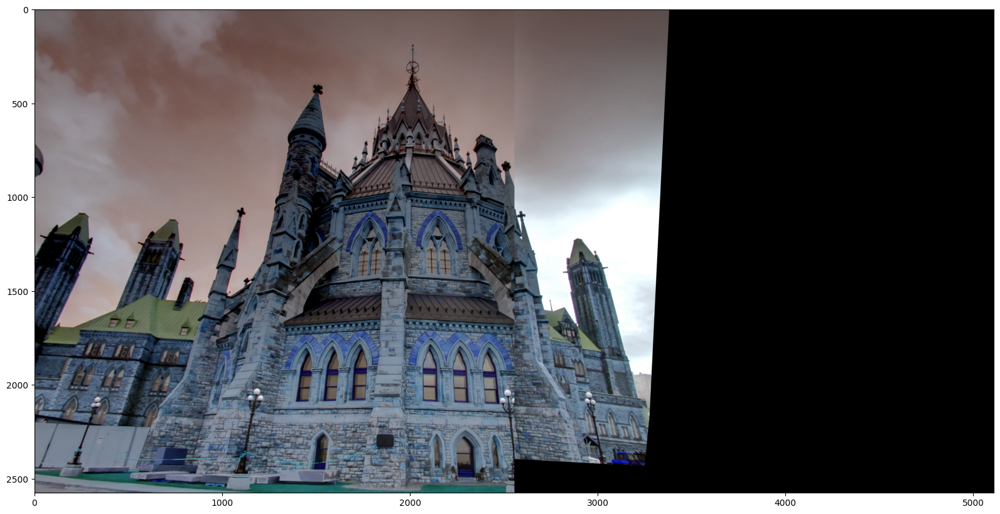

<Figure size 1500x1500 with 0 Axes>

In [10]:
###step 7

# Load the original color images
image1_color = cv2.imread('parliament-left.jpg')
image2_color = cv2.imread('parliament-right.jpg')

# warpping image
padded_image = np.pad(image2_color, ((0, 0), (0, 0), (0, 0)), mode='constant')
height, width, _ = image1_color.shape
img2_transformed = cv2.warpAffine(image2_color, best_affine_transform, (width, height))
warped_img2 = img2_transformed
warped_img2_cropped = warped_img2[:image2_color.shape[0], :image2_color.shape[1], :]
warped_img2_normalized = warped_img2.astype(float)
warped_img2_normalized /= np.max(warped_img2_normalized)


# Calculate the size of the mosaic
mosaic_height = max(image1_color.shape[0], warped_img2_normalized.shape[0])
mosaic_width = image1_color.shape[1] + warped_img2_normalized.shape[1]

# Create a new image large enough to hold the mosaic
mosaic = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.uint8)

# Paste the images onto the mosaic
mosaic[:image1_color.shape[0], :image1_color.shape[1], :] = image1_color
mosaic[:warped_img2_normalized.shape[0], image1_color.shape[1]:, :] = (warped_img2_normalized * 255).astype(np.uint8)

# Display the color mosaic result
plt.figure(figsize=(20, 10))
plt.imshow(mosaic)
plt.show()
plt.savefig('finalResult_partA.png')


In [16]:
##display
cv2.imshow("Result", mosaic)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [11]:
###########part B

In [12]:
#gettin images
def read_image(path):
    img = cv2.imread(path)
    gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
    return gray, img, rgb

In [13]:
def SIFT(img):
    siftDetector= cv2.SIFT_create()
    #extracting keypoints and descriptors
    kp, des = siftDetector.detectAndCompute(img, None)
    return kp, des

def plot_sift(gray, rgb, kp):
    tmp = rgb.copy()
    img = cv2.drawKeypoints(gray, kp, tmp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

def select_random_points(matches, num_points=4):
    selected_indices = random.sample(range(len(matches)), num_points)
    selected_points = [matches[i] for i in selected_indices]
    return np.array(selected_points)

def calculate_error(points, homography_matrix):
    num_points = len(points)

    # Construct matrices for calculations
    all_p1 = np.concatenate((points[:, 0:2], np.ones((num_points, 1))), axis=1)
    all_p2 = points[:, 2:4]
    
    # Estimate transformed points using homography matrix
    estimate_p2 = np.zeros((num_points, 2))
    for i in range(num_points):
        temp = np.dot(homography_matrix, all_p1[i])
        estimate_p2[i] = (temp / temp[2])[:2]  # Set index 2 to 1 and slice indices 0 and 1
    
    # Compute error
    errors = np.linalg.norm(all_p2 - estimate_p2, axis=1) ** 2

    return errors


In [14]:
def matcher(kp1, des1, img1, kp2, des2, img2, threshold):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2, k=2)

    good_match = []
    for m,n in matches:
        if m.distance < threshold*n.distance:
            good_match.append([m])

    matches = []
    for pair in good_match:
        matches.append(list(kp1[pair[0].queryIdx].pt + kp2[pair[0].trainIdx].pt))

    matches = np.array(matches)
    return matches

In [22]:
def display_matches(matches, total_image):
    matched_image = total_image.copy()
    image_width_offset = total_image.shape[1] / 2

    # Create a subplot
    fig, ax = plt.subplots()
    ax.set_aspect('equal')
    ax.imshow(np.array(matched_image).astype('uint8'))  # RGB is of integer type

    # Plot
    ax.plot(matches[:, 0], matches[:, 1], 'xr')
    ax.plot(matches[:, 2] + image_width_offset, matches[:, 3], 'xr')

    ax.plot([matches[:, 0], matches[:, 2] + image_width_offset],
            [matches[:, 1], matches[:, 3]],
            'r', linewidth=0.5)
    plt.show()


In [23]:
def calculate_homography_matrix(point_pairs):
    matrix_rows = []

    for i in range(point_pairs.shape[0]):
        p1 = np.append(point_pairs[i][0:2], 1)
        p2 = np.append(point_pairs[i][2:4], 1)

        row1 = [0, 0, 0, p1[0], p1[1], p1[2], -p2[1]*p1[0], -p2[1]*p1[1], -p2[1]*p1[2]]
        row2 = [p1[0], p1[1], p1[2], 0, 0, 0, -p2[0]*p1[0], -p2[0]*p1[1], -p2[0]*p1[2]]

        matrix_rows.append(row1)
        matrix_rows.append(row2)

    matrix_rows = np.array(matrix_rows)
    _, _, V = np.linalg.svd(matrix_rows)
    homography_matrix = V[-1].reshape(3, 3)
    homography_matrix = homography_matrix / homography_matrix[2, 2]  # Standardize to ensure w * H[2, 2] = 1

    return homography_matrix


In [24]:
def ransac_algorithm(matches, threshold, iterations):
    best_inlier_count = 0

    for _ in range(iterations):
        random_points = select_random_points(matches)
        homography_matrix = calculate_homography_matrix(random_points)

        # Avoid division by zero
        if np.linalg.matrix_rank(homography_matrix) < 3:
            continue

        errors = calculate_error(matches, homography_matrix)
        inlier_indices = np.where(errors < threshold)[0]
        inliers = matches[inlier_indices]

        current_inlier_count = len(inliers)
        if current_inlier_count > best_inlier_count:
            best_inliers = inliers.copy()
            best_inlier_count = current_inlier_count
            best_homography_matrix = homography_matrix.copy()

    print("Inliers/Matches: {}/{}".format(best_inlier_count, len(matches)))
    return best_inliers, best_homography_matrix


In [25]:
def stitch(left_image, right_image, homography_matrix):
    print("Stitching images...")

    # Normalize images to avoid noise
    left_normalized = cv2.normalize(left_image.astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)
    right_normalized = cv2.normalize(right_image.astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)

    # Fixing the perspective of the left image
    height_left, width_left, channel_left = left_normalized.shape
    corners_left = [[0, 0, 1], [width_left, 0, 1], [width_left, height_left, 1], [0, height_left, 1]]
    corners_new_left = [np.dot(homography_matrix, corner) for corner in corners_left]
    corners_new_left = np.array(corners_new_left).T
    x_news_left = corners_new_left[0] / corners_new_left[2]
    y_news_left = corners_new_left[1] / corners_new_left[2]
    y_min_left = min(y_news_left)
    x_min_left = min(x_news_left)

    translation_mat_left = np.array([[1, 0, -x_min_left], [0, 1, -y_min_left], [0, 0, 1]])
    homography_matrix = np.dot(translation_mat_left, homography_matrix)

    height_new_left = int(round(abs(y_min_left) + height_left))
    width_new_left = int(round(abs(x_min_left) + width_left))
    size_left = (width_new_left, height_new_left)

    # Fixing the perspective of the right image (wrapping)
    warped_left = cv2.warpPerspective(src=left_normalized, M=homography_matrix, dsize=size_left)
    height_right, width_right, channel_right = right_normalized.shape
    height_new_right = int(round(abs(y_min_left) + height_right))
    width_new_right = int(round(abs(x_min_left) + width_right))
    size_right = (width_new_right, height_new_right)
    warped_right = cv2.warpPerspective(src=right_normalized, M=translation_mat_left, dsize=size_right)
    black_pixel = np.zeros(3)

    # Stitching
    for i in tqdm(range(min(warped_left.shape[0], warped_right.shape[0]))):
        for j in range(min(warped_left.shape[1], warped_right.shape[1])):
            pixel_left = warped_left[i, j, :]
            pixel_right = warped_right[i, j, :]

            if not np.array_equal(pixel_left, black_pixel) and np.array_equal(pixel_right, black_pixel):
                warped_left[i, j, :] = pixel_left
            elif np.array_equal(pixel_left, black_pixel) and not np.array_equal(pixel_right, black_pixel):
                warped_left[i, j, :] = pixel_right
            elif not np.array_equal(pixel_left, black_pixel) and not np.array_equal(pixel_right, black_pixel):
                warped_left[i, j, :] = (pixel_left + pixel_right) / 2
            else:
                pass

    stitched_image = warped_left[:warped_right.shape[0], :warped_right.shape[1], :]
    return stitched_image


In [26]:
def do_all(i1,i2):
    left_gray, left_origin, left_rgb = read_image(i1)
    right_gray, right_origin, right_rgb = read_image(i2)
    # Better result when using gray
    kp_left, des_left = SIFT(left_gray)
    kp_right, des_right = SIFT(right_gray)
    kp_left_img = plot_sift(left_gray, left_rgb, kp_left)
    kp_right_img = plot_sift(right_gray, right_rgb, kp_right)
    # Resize one of the images to match the height of the other
    height1, width1 = kp_left_img.shape[:2]
    height2, width2 = kp_right_img.shape[:2]

    if height1 < height2:
        kp_left_img = cv2.resize(kp_left_img, (width1, height2))
    elif height2 < height1:
        kp_right_img = cv2.resize(kp_right_img, (width2, height1))
    total_kp = np.concatenate((kp_left_img, kp_right_img), axis=1)
    matches = matcher(kp_left, des_left, left_rgb, kp_right, des_right, right_rgb, 0.5)
    # Resize one of the images to match the height of the other
    height1, width1 = left_rgb.shape[:2]
    height2, width2 = right_rgb.shape[:2]

    if height1 < height2:
        left_rgb = cv2.resize(left_rgb, (width1, height2))
    elif height2 < height1:
        right_rgb = cv2.resize(right_rgb, (width2, height1))
    total_img = np.concatenate((left_rgb, right_rgb), axis=1)
    inliers, H = ransac_algorithm(matches, 0.5, 2000)
    img = stitch(left_rgb, right_rgb, H)
    return img

Inliers/Matches: 110/219
Stitching images...


  0%|          | 0/840 [00:00<?, ?it/s]

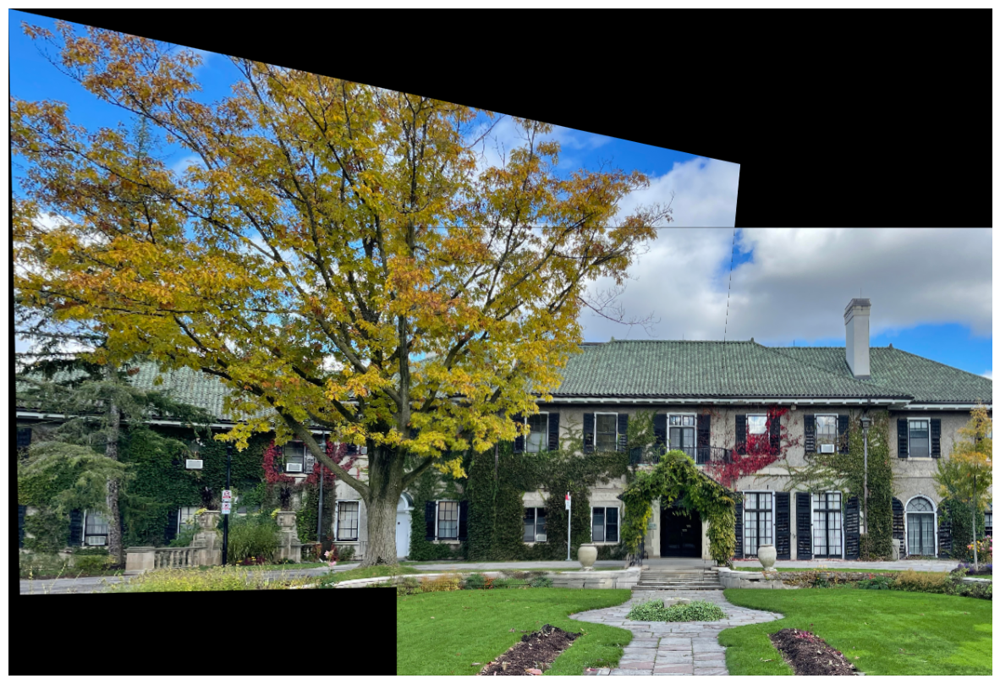

In [30]:
img12 = do_all('1.png','2.png')
plt.imshow(img12)
plt.axis('off')
plt.savefig('12.png', bbox_inches='tight', pad_inches=0,transparent=True)

Inliers/Matches: 97/207
Stitching images...


  0%|          | 0/608 [00:00<?, ?it/s]

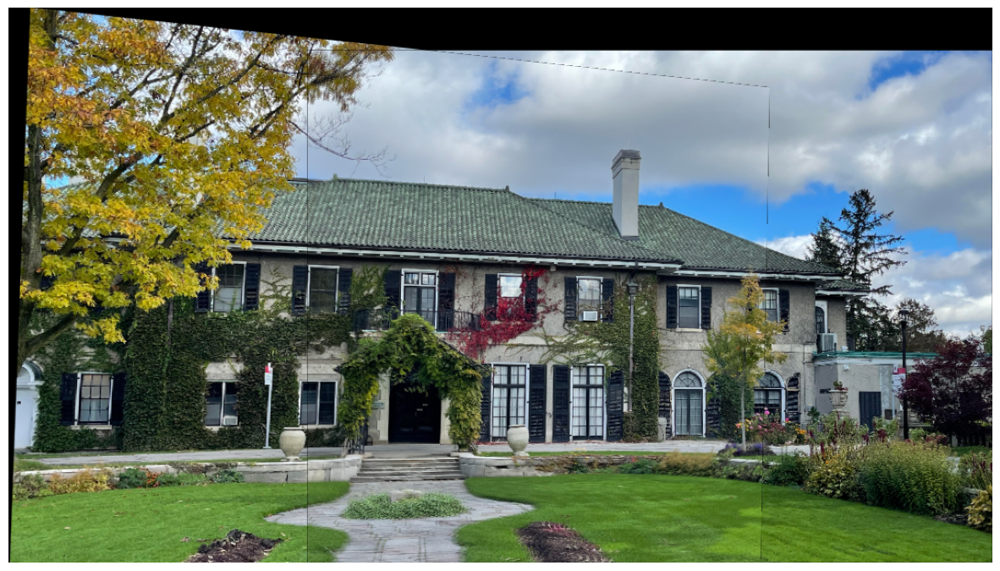

In [31]:
img23 = do_all('2.png','3.png')
plt.imshow(img23)
plt.axis('off')
plt.savefig('23.png', bbox_inches='tight', pad_inches=0,transparent=True)

Inliers/Matches: 658/950
Stitching images...


  0%|          | 0/1296 [00:00<?, ?it/s]

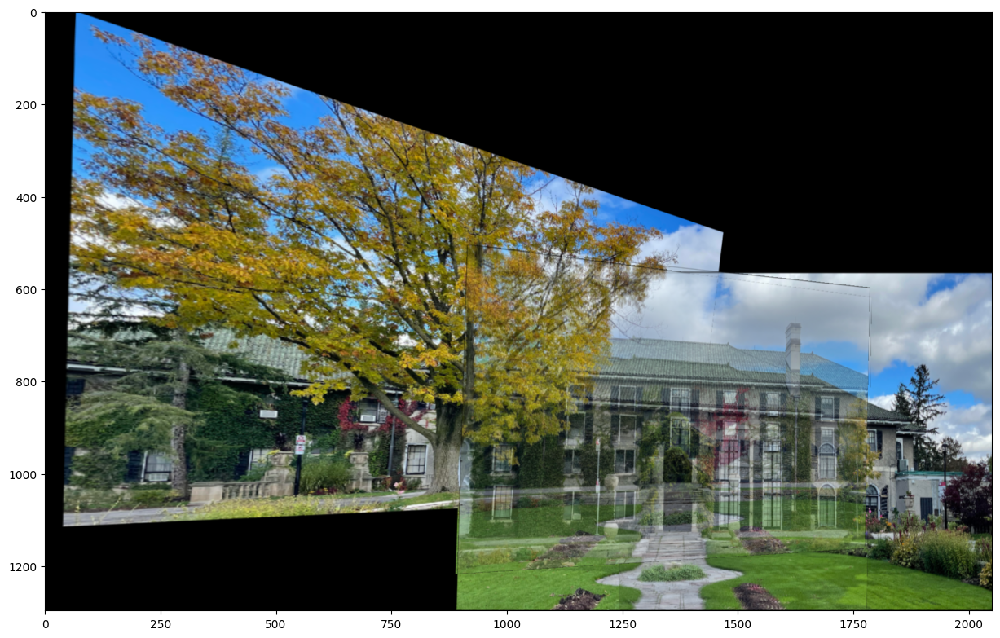

In [32]:
imgf = do_all('12.png','23.png')
plt.imshow(imgf)
plt.savefig('final result partB.png')

In [ ]:
##display
cv2.imshow("Result", imgf)
cv2.waitKey(0)
cv2.destroyAllWindows()